# LenslessMic

This is a demo notebook for the ["LenslessMic: Audio Encryption and Authentication via Lensless Computational Imaging"](https://arxiv.org/abs/2509.16418) paper. In this notebook, we will show how to download models and data and how to reconstruct audio signal.

If you are working in a notebook from the `notebooks` folder of the main [repo]() instead of Colab, you can use code directly by adding:

```python
from pathlib import Path

# notebook is located in REPO_DIR / notebooks / demo.ipynb
ROOT_PATH = Path(".").absolute().resolve().parent

import sys
sys.path.append(str(ROOT_PATH))
```

For Colab, let's start by downloading the github repository

In [1]:
!git clone https://github.com/Blinorot/LenslessMic.git

Cloning into 'LenslessMic'...
remote: Enumerating objects: 1569, done.
remote: Counting objects: 100% (307/307), done.
remote: Compressing objects: 100% (216/216), done.
remote: Total 1569 (delta 195), reused 180 (delta 91), pack-reused 1262 (from 1)
Receiving objects: 100% (1569/1569), 37.58 MiB | 26.39 MiB/s, done.
Resolving deltas: 100% (1061/1061), done.


In [1]:
# if you are in Google Colab
%cd LenslessMic

/content/LenslessMic


In [3]:
!ls

calc_metrics.py  LICENSE	   rpi_requirements.txt  train_gan.py
data		 README.md	   scripts		 train.py
inference.py	 requirements.txt  src


We need to install required packages (since Colab has a newer version of Python, we add `--ignore-requires-python`, ideally a `conda` env should be used). If the colab asks to restart the session, run `%cd LenslessMic` cell again after restart

In [ ]:
!pip install -r requirements.txt --ignore-requires-python

To download data and models, we use the corresponding scripts. If we try to download too much files, HF may block us until we authorize. So, let's authorize. Resume download several times if needed and/or reduce the `max_workers`

In [2]:
from google.colab import userdata
from huggingface_hub import login

login(token=userdata.get('huggingface'))

In [7]:
%%writefile download_all.sh
# Define your base path

ROOT_DIR=$(pwd)

cd scripts/
# download data; we are interested in the test-clean, for example
# let's indicate the codec we are interested in
# for the local-dir, we only indicate the root name
python3 download_dataset.py --repo-id "Blinorot/lensless_mic_librispeech" \
   --remote-path "test-clean/32x32_120_16khz_original/lensed/" \
   --local-dir "${ROOT_DIR}/data/datasets/librispeech"
   --max-workers 4
# now let's download the lensless measurements
python3 download_dataset.py --repo-id "Blinorot/lensless_mic_librispeech" \
   --remote-path "test-clean/32x32_120_16khz_original/lensless_measurement/" \
   --local-dir "${ROOT_DIR}/data/datasets/librispeech"
   --max-workers 4
# and the actual audio
python3 download_dataset.py --repo-id "Blinorot/lensless_mic_librispeech" \
   --remote-path "test-clean/audio/" \
   --local-dir "${ROOT_DIR}/data/datasets/librispeech"
   --max-workers 2
# download model
python3 download_models.py --remote-path "32x32_librispeech_mse_ssim_raw_ssim_PSF_Unet4M_U5_Unet4M/" # Learned from the paper
# download codec
# python3 download_dac.py --remote-path "16x16_130_16khz/latest/dac/weights.pth" # if we wanted 16x16
python3 download_dac.py --download_original # to download original 32x32

Overwriting download_all.sh


In [ ]:
!bash download_all.sh

Let's have a look at the data. To do so, we first need to load our codec of interest and the configuration for the PSF simulation.

In [2]:
from omegaconf import OmegaConf, open_dict
from src.utils.init_utils import resolve_class
from src.utils.io_utils import ROOT_PATH
from hydra.utils import instantiate

OmegaConf.register_new_resolver("resolve_class", resolve_class)

In [3]:
codec_config = OmegaConf.load(ROOT_PATH / "src/configs/codec/dac.yaml")
# because we load directly, we have to resolve manually
codec_config = OmegaConf.to_container(codec_config, resolve=False)
codec_config["codec_name"] = "32x32_120_16khz_original" # change to our codec
codec_config["codec_weights_path"] = codec_config["codec_weights_path"].replace("${codec.codec_name}", codec_config["codec_name"])
codec = instantiate(codec_config)
print(f"Loaded codec: {codec.codec_name}")

/usr/local/lib/python3.12/dist-packages/torch/nn/utils/weight_norm.py:28: UserWarning: torch.nn.utils.weight_norm is deprecated in favor of torch.nn.utils.parametrizations.weight_norm.
  warnings.warn("torch.nn.utils.weight_norm is deprecated in favor of torch.nn.utils.parametrizations.weight_norm.")


Loaded codec: 32x32_120_16khz_original


In [39]:
psf_config = OmegaConf.load(ROOT_PATH / "src/configs/psf/simulate.yaml")
psf_config = OmegaConf.to_container(psf_config)

Now we can load the dataset

In [5]:
from src.datasets import LibrispeechDataset

dataset = LibrispeechDataset(part="test-clean", max_audio_length=5,
                             lensless_tag="measurement", codec=codec, sim_psf_config=psf_config)

In [6]:
len(dataset)

1089

Let's listen to the audio for one of the elements of the dataset and look how its video representation looks like. The version obtained directly from config is referred to as `lensed` and the corresponding lensless measurement -- `lensless`.

In [26]:
# example
ind = 545
data_dict = dataset[ind]
print("Keys", data_dict.keys())

Keys dict_keys(['audio', 'text', 'audio_path', 'lensed_codec_video', 'lensless_codec_video', 'lensless_psf', 'min_vals', 'max_vals', 'pad_mask', 'n_orig_frames'])


In [27]:
# add batch dim
audio = data_dict["audio"].unsqueeze(0)
lensed = data_dict["lensed_codec_video"].unsqueeze(0)
lensless = data_dict["lensless_codec_video"].unsqueeze(0)
min_vals = data_dict["min_vals"] # already with batch dim
max_vals = data_dict["max_vals"] # already with batch dim
psf = data_dict["lensless_psf"].unsqueeze(0)
sr = dataset.target_sr

# we do not need pad_mask and n_orig_frames here. They are useful only if group is used

In [28]:
from IPython import display

display.Audio(audio[0], rate=sr)

Let's also have a look at the PSF for this object.

**Note**: The frame is grayscale and displayed on the screen as black-and-white image. Camera captures it as an RGB image with an RGB PSF. Then, the image is converted to grayscale and, therefore, we use grayscale PSF during reconstruction.

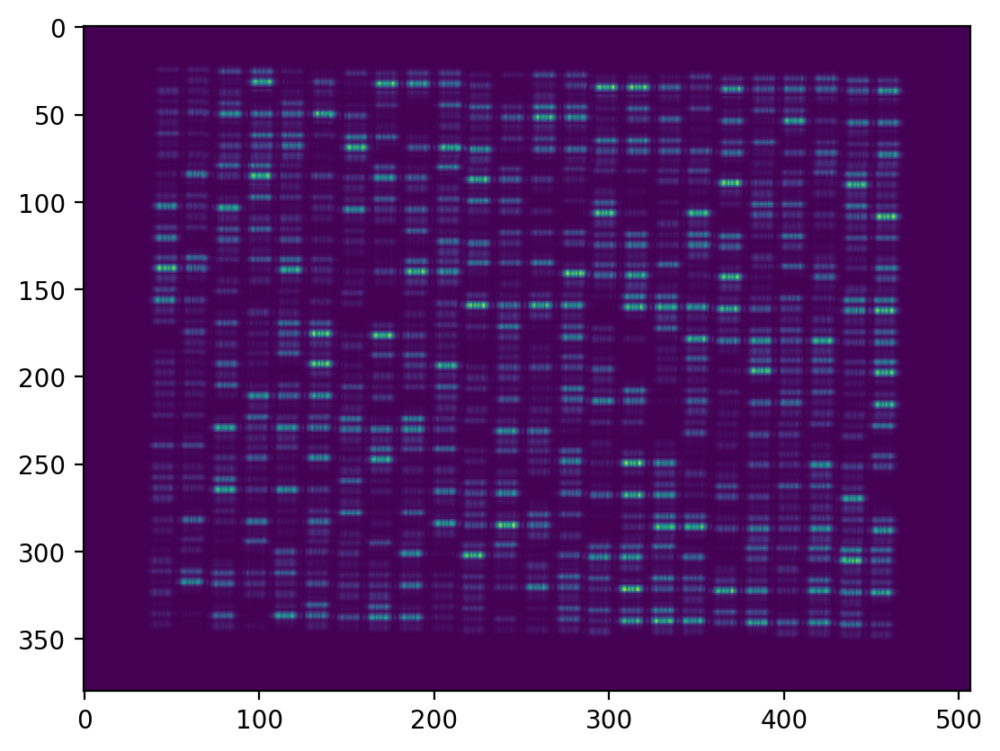

In [15]:
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format='retina'

import numpy as np

img = psf[0][0].numpy() # remove batch and depth
# normalize for better plotting
img = img / np.abs(img).max()

plt.imshow(img) # grayscale

We can explicitly load the RGB version of this PSF:

In [40]:
from pathlib import Path
import numpy as np
from src.lensless.utils import simulate_psf_from_mask

def get_rgb_psf(audio_path, dataset):
    audio_path = Path(audio_path)
    filename = audio_path.stem
    video_dir = audio_path.parents[1] / f"{dataset.codec_name}" / "lensed"
    lensless_video_dir = (
        audio_path.parents[1]
        / f"{dataset.codec_name}"
        / f"lensless_{dataset.lensless_tag}"
    )
    lensless_mask_label = lensless_video_dir / f"{filename}.txt"
    lensless_mask_label = lensless_mask_label.read_text()
    lensless_mask_path = (
        lensless_video_dir / "masks" / f"mask_{lensless_mask_label}.npy"
    )
    lensless_mask = np.load(lensless_mask_path)
    sim_psf_config = dataset.sim_psf_config
    rgb_psf_config = {k: v for k, v in sim_psf_config.items()}
    rgb_psf_config["grayscale"] = False
    lensless_psf = simulate_psf_from_mask(
        lensless_mask, **rgb_psf_config
    )
    return lensless_psf

Text(0.5, 1.0, 'rgb + gamma (2.5)')

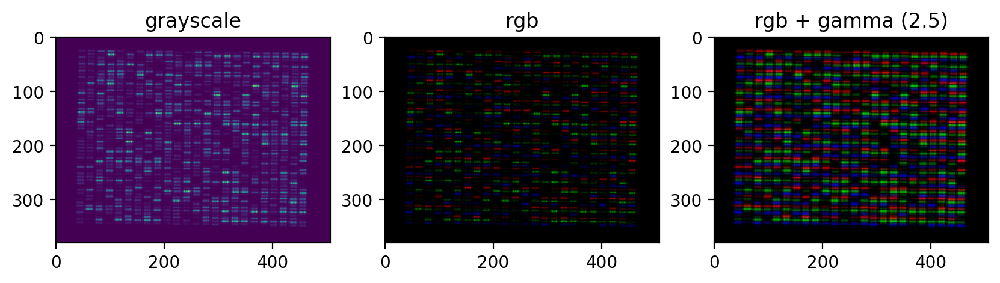

In [41]:
from lensless.utils.image import gamma_correction

audio_path = data_dict["audio_path"]
rgb_psf = get_rgb_psf(audio_path, dataset).unsqueeze(0)

img = psf[0][0].numpy() # remove batch and depth
rgb_img = rgb_psf[0][0].numpy() # remove batch and depth
# normalize for better plotting
img = img / np.abs(img).max()
rgb_img = rgb_img / np.abs(rgb_img).max()

# we can use gamma correction to highlight pixels better
# used only for plotting
gamma = 2.5
gamma_img = gamma_correction(rgb_img, gamma=gamma)


fig, axes = plt.subplots(1, 3, figsize=(10, 10))
axes[0].imshow(img) # grayscale
axes[1].imshow(rgb_img) # rgb
axes[2].imshow(gamma_img) # rgb + gamma correction
axes[0].set_title("grayscale")
axes[1].set_title("rgb")
axes[2].set_title(f"rgb + gamma ({gamma})")

Let's look at the video representation (output of audio-to-video conversion using the codec) and the corresponding lensless measurement.

**Warning: the video may be blinking too fast**



In [19]:
from src.logger.utils import plot_tensor_as_video

In [41]:
display.HTML(plot_tensor_as_video(lensed[0][0].permute(3, 0, 1, 2))) # remove Batch and Depth, permut to TxHxWxC

In [43]:
display.HTML(plot_tensor_as_video(lensless[0][0].permute(3, 0, 1, 2))) # remove Batch and Depth, permut to TxHxWxC

To reconstruct audio, we need a reconstruction algorithm. For example, we can use `Learned` method from the paper, which weights we downloaded previously.

The reconstructed video is of the sensor size, however, the actual reconstructed frame is only a part of the sensor image. Therefore, we need to extract the region of interest. Since Trainable methods need defined ROI before they can be trained, we captured an image of a white square on the screen and reconstructed it using ADMM (ADMM does not need training). Then, we defined ROI by manual analysis of the reconstruction.  

In [12]:
import torch

device = "cuda" if torch.cuda.is_available() else "cpu"
model_config = OmegaConf.load(ROOT_PATH / "src/configs/model/PSF_Unet4M_U5_Unet4M.yaml")
model = instantiate(model_config)
model_state_dict_path = ROOT_PATH / "data" / "lensless_exps" / "32x32_librispeech_mse_ssim_raw_ssim_PSF_Unet4M_U5_Unet4M/checkpoint-epoch100.pth"
model_state_dict = torch.load(model_state_dict_path, map_location="cpu")["state_dict"]
model.load_state_dict(model_state_dict)
model.eval()
model.change_requires_grad(requires_grad=False) # we are not training
model.to(device)

# roi_kwargs, resize_coef, etc.
recon_config = OmegaConf.load(ROOT_PATH / "src/configs/reconstruction/32x32.yaml")
recon_config = OmegaConf.to_container(recon_config)

To reconstruct audio, we first need to recover the original video

In [13]:
from src.lensless.pipeline import reconstruct_codec

If we do not set `resize_coef` and `roi_kwargs`, we get the full video reconstruction:

In [45]:
# do not forget to put everything on device
recovered_video = reconstruct_codec(lensless_codec_video=lensless.to(device), recon_model=model,
                                    min_vals=min_vals.to(device), max_vals=max_vals.to(device),
                                    lensless_psf=psf.to(device), # provide psf for this video
                                    resize_coef=1, roi_kwargs=None, normalize_lensless=True)
recovered_video = recovered_video.detach().cpu()

In [46]:
display.HTML(plot_tensor_as_video(recovered_video[0][0].permute(3, 0, 1, 2),
                                  roi_kwargs=recon_config["roi_kwargs"])) # roi_kwargs here adds a red box

To extract this block of interest we provide `roi_kwargs` to the algorithm. We also provide `resize_coef` because the frame on the sensor contains `resize_coef`^2 super-pixels.

In [47]:
recovered_video = reconstruct_codec(lensless_codec_video=lensless.to(device), recon_model=model,
                                    min_vals=min_vals.to(device), max_vals=max_vals.to(device),
                                    lensless_psf=psf.to(device),
                                    resize_coef=recon_config["resize_coef"],
                                    roi_kwargs=recon_config["roi_kwargs"], normalize_lensless=True)
recovered_video = recovered_video.detach().cpu()

In [48]:
display.HTML(plot_tensor_as_video(recovered_video[0][0].permute(3, 0, 1, 2))) # remove Batch and Depth, permut to TxHxWxC

Now we use our codec to get audio from the reconstructed video

In [49]:
recon_audio = codec.video_to_audio(recovered_video).detach()

In [50]:
display.Audio(recon_audio[0], rate=sr)

Sounds nice! Let's compare the plots

In [51]:
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format='retina'

In [52]:
time_audio = torch.arange(audio.shape[-1]) / sr
time_recon = torch.arange(recon_audio.shape[-1]) / sr
# due to codec downsampling and upsampling, recon and audio lengths may differ a bit

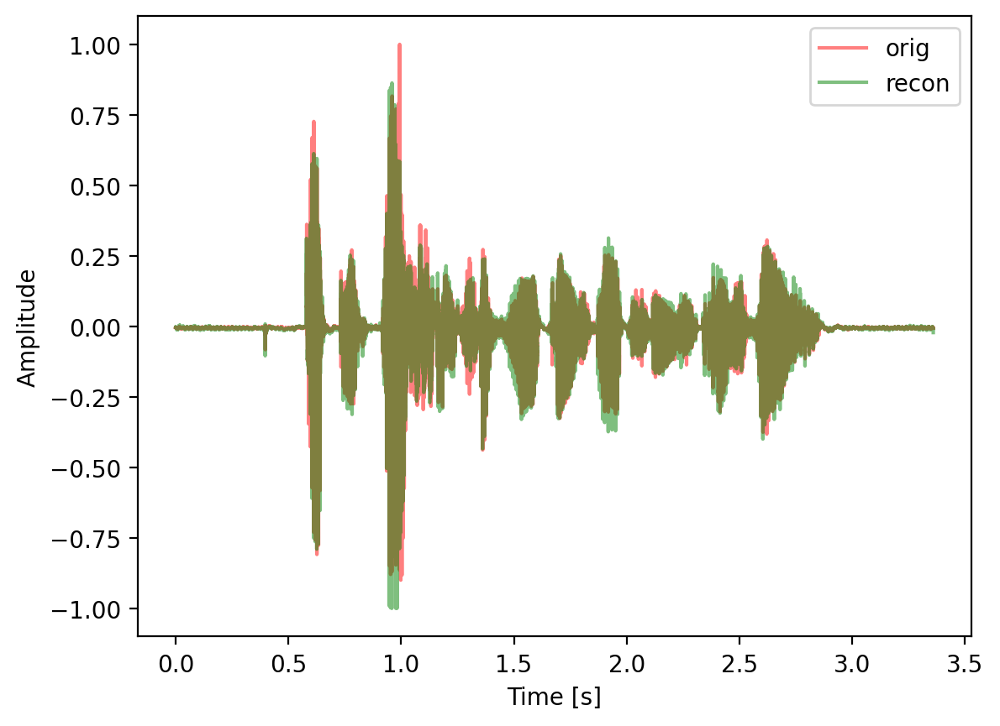

In [53]:
plt.plot(time_audio, audio[0][0], color="red", alpha=0.5, label="orig")
plt.plot(time_recon, recon_audio[0][0], color="green", alpha=0.5, label="recon")
plt.xlabel("Time [s]")
plt.ylabel("Amplitude")
plt.legend()
plt.show()

Indeed, they overlap well! Apart from encryption with a physical level of security, LenslessMic can be used for authentication. This is because using incorrect PSF results in noise. Let's use a random PSF instead of the correct one

In [54]:
from src.lensless.utils import simulate_psf_from_mask
import numpy as np

dataset_collection_config = OmegaConf.load(ROOT_PATH / "src/configs/scripts/collect_dataset_multimask.yaml")
mask_shape = dataset_collection_config.masks.shape

random_mask = np.random.uniform(0, 1, mask_shape)
random_psf = simulate_psf_from_mask(random_mask, **psf_config).unsqueeze(0)

In [55]:
print(not torch.allclose(random_psf, psf))

True


Text(0.5, 1.0, 'Random PSF')

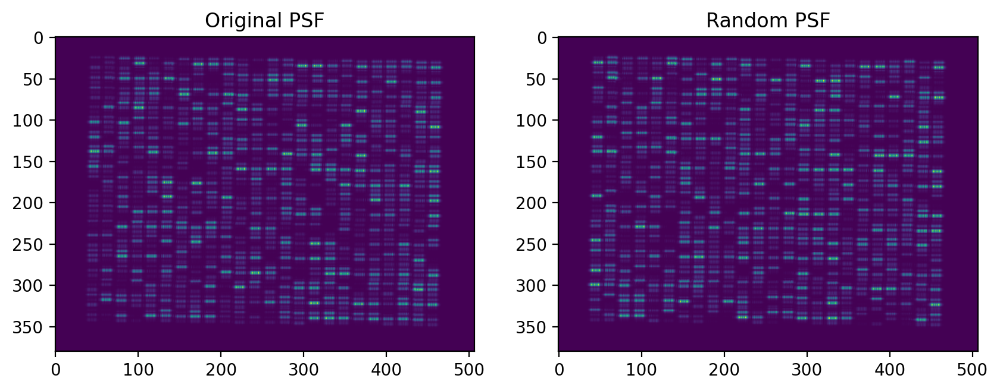

In [56]:
img = psf[0][0].numpy() # remove batch and depth
random_img = random_psf[0][0].numpy() # remove batch and depth
# normalize for better plotting
img = img / np.abs(img).max()
random_img = random_img / np.abs(random_img).max()


fig, axes = plt.subplots(1, 2, figsize=(10, 10))
axes[0].imshow(img) # grayscale
axes[1].imshow(random_img) # rgb
axes[0].set_title("Original PSF")
axes[1].set_title("Random PSF")

In [58]:
recovered_video = reconstruct_codec(lensless_codec_video=lensless.to(device), recon_model=model,
                                    min_vals=min_vals.to(device), max_vals=max_vals.to(device),
                                    lensless_psf=random_psf.to(device), # use random PSF instead
                                    resize_coef=recon_config["resize_coef"],
                                    roi_kwargs=recon_config["roi_kwargs"], normalize_lensless=True)
recovered_video = recovered_video.detach().cpu()

In [59]:
display.HTML(plot_tensor_as_video(recovered_video[0][0].permute(3, 0, 1, 2))) # remove Batch and Depth, permut to TxHxWxC

In [60]:
random_psf_recon_audio = codec.video_to_audio(recovered_video).detach()

In [61]:
display.Audio(random_psf_recon_audio[0], rate=sr)

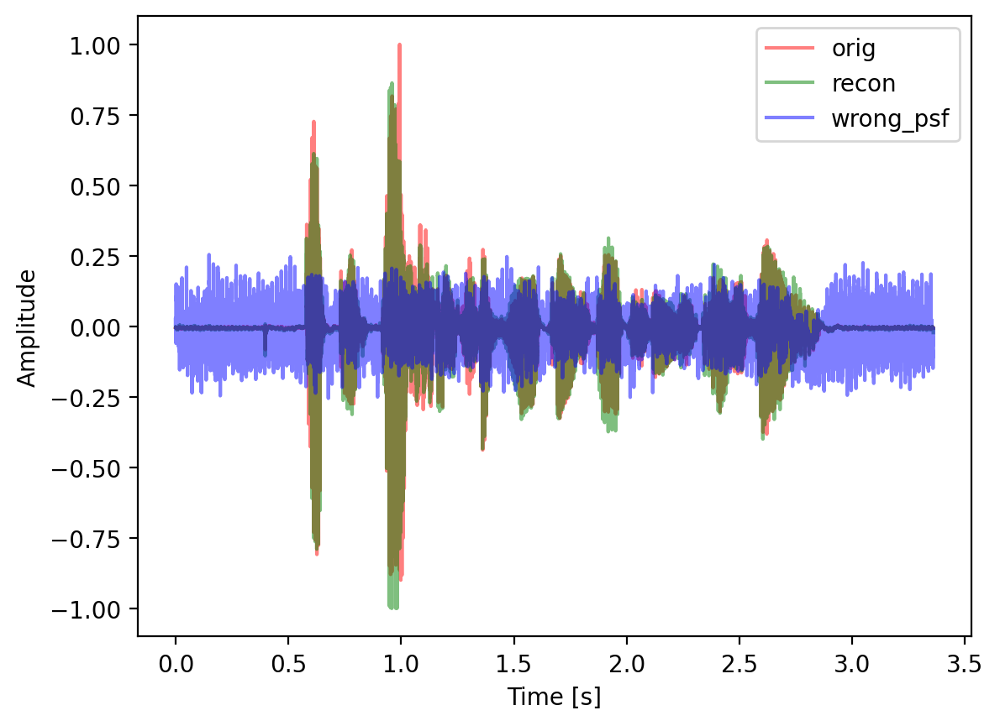

In [62]:
plt.plot(time_audio, audio[0][0], color="red", alpha=0.5, label="orig")
plt.plot(time_recon, recon_audio[0][0], color="green", alpha=0.5, label="recon")
plt.plot(time_recon, random_psf_recon_audio[0][0], color="blue", alpha=0.5, label="wrong_psf")
plt.xlabel("Time [s]")
plt.ylabel("Amplitude")
plt.legend()
plt.show()

Since it sounds like noise, we can distinguish the reconstruction that used correct PSF from the reconstruction that used incorrect PSF easily. For example, using metrics such as WER (if text is available) or UTMOS (if there is no ground-truth text/audio). Thus, PSF serves as an authentication key